In [4]:
#@title 
import pandas as pd
import shutil
import numpy as np 
import seaborn as sns 
import glob
import os 
from datetime import *
import seaborn as sns
import copy
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime
import plotly.express as px
from google.colab import files
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [5]:
#@title 
#above string is used to hide code block
'''
Purpose: Adds date_only and time_only columns to dataframe
Column values are filled based on 'DateTime Column'
This DIRECTLY changes the dataframe, it does NOT return a copy
@param df : a dataframe, this will be a file consisting of data
  from each pod pooled together
'''
def add_dates_times_columns(df):
  # insert date only, time only, and DateTime Columns
  # adding a filler value x or y that will be replaced later
  df.insert(1, 'date_only', 'x')
  df.insert(2, 'time_only', 'y')
  
  # change name of Time column to datetime for clarity that it is a datetime
  df.rename(columns={'Time' : 'DateTime'}, inplace=True)
  #copy string of DateTime to time and date only columns
  df['date_only'] = df['DateTime']
  df['time_only'] = df['DateTime']

  # convert strings to appropriate data type - DateTime, date, and time
  df['DateTime'] = pd.to_datetime(df['DateTime'], format="%Y-%m-%d %H:%M:%S")
  df['date_only'] = pd.to_datetime(df['date_only']).dt.date
  df['time_only'] = pd.to_datetime(df['time_only']).dt.time

  # resetting index to make it look neat
  df.reset_index(drop=True, inplace=True)

def cardinal_direction(df): 
  condition_list = [(df['Wind Direction'] > 0) & (df['Wind Direction'] < 45), (df['Wind Direction'] == 45), 
                    (df['Wind Direction'] > 45) & (df['Wind Direction'] <= 90), (df['Wind Direction'] > 90) & (df['Wind Direction'] < 135), (df['Wind Direction'] == 135), 
                    (df['Wind Direction'] > 135) & (df['Wind Direction'] <= 180), (df['Wind Direction'] > 180) & (df['Wind Direction'] < 225), (df['Wind Direction'] == 225), 
                    (df['Wind Direction'] > 225) & (df['Wind Direction'] <= 270), (df['Wind Direction'] > 270) & (df['Wind Direction'] < 315), (df['Wind Direction'] == 315), 
                    (df['Wind Direction'] > 315) & (df['Wind Direction'] <= 360) ]
  choicelist = ['North','North-East', 'East', 'East', 'South-East', 'South', 'South', 'South-West', 'West', 'West', 'North-West', 'North']
  
  df['Cardinal Direction'] = np.select(condition_list, choicelist) #adding the cardinal direction column
  direction_values=df['Cardinal Direction'].values #to get the values either as array or a series
  
  df.drop(['Cardinal Direction'], axis=1, inplace=True) # we need to drop the column to relocate to the position we want
  df.insert(15,'Cardinal Direction',value=direction_values)
  return df # to return the dataframe when the function is called\

'''
Purpose: The get_weather_master function more than just the necessary
  weather data and adds them to the google colab local files.
  This function will remove unnecssary files in order to save 
  memory/space in the local colab session.
'''
def clean_up():
  main_dir_path = '/content/stinky/'
  list_files = os.listdir(main_dir_path)

  for i in list_files:
    path = main_dir_path + i
    try:
      os.remove(path)
    except:
      pass

  try:
    shutil.rmtree('/content/stinky/vessels_data_raw', ignore_errors=True)
    shutil.rmtree('/content/stinky/weather_data_raw', ignore_errors=True)
    shutil.rmtree('/content/stinky/weather_data/weather_intermediary_files',
                  ignore_errors=True)
  except:
    pass
 


def get_weather_master():
  shutil.rmtree('/content/stinky', ignore_errors=True)
  !git clone https://github.com/ds5110/stinky

  path = 'stinky/weather_data/pod_raw_data/'
  lst = os.listdir(path)

  df= pd.DataFrame()
  df_new= pd.DataFrame()

  for i in lst:
    url = path+i
    if i[-4:]==".csv":
      if df.empty==True :
        df = pd.read_csv(url)
        df["Pod Name"] = i[:5]
      else:
        df_new= pd.read_csv(url)
        df_new["Pod Name"]= i[:5]
        df= df.append(df_new)

  add_dates_times_columns(df)
  df = cardinal_direction(df)

  df = df.sort_values(by=['Pod Name','DateTime'])
  df.reset_index(drop=True, inplace=True)
  df.rename(columns={'DateTime':'Date & time (hour rounded)', 
                     'date_only':'date', 'time_only':'time (hour rounded)'}
            , inplace=True)
  
  clean_up()

  return df

In [6]:
#@title 
'''
Purpose : A helper function to weather_df_interval_groupby_for_plot.
    This remove columns with all values that are NA
@param df_weather_master : dataframe, the weather master dataframe
    i.e. the return value of get_weather_master()
return: dataframe, a processed copy of the weather master
'''
def column_process_weather_df(df_weather_master):
  df_copy = df_weather_master.copy()
  df_copy =df_copy.dropna(axis=1, how='all')
  df_copy.pop('date')
  df_copy.pop('time (hour rounded)')

  return df_copy


'''
Purpose: A helper function for aggregation in weather_df_process_for_plotting
    This is used to get mode of cardinal directions for any time interval
@param: a pandas series containing strings of cardinal directions
@return: a string representation of the mode
'''
def determine_direction_mode(df_column):
  df_mode = df_column.mode()
  if (len(df_mode.index) > 1):
    return 'None'
  else:
    return df_mode


'''
Purpose: To create a datetime object from date values as integers
This is a helper function to get_weather_info_helper
@param day_int : an integer representing the numerical day
@param month_int : an integer representing the numerical month i.e. January is 1
@param year_int : the year represented as a 4 digit integer i.e. 2020
@param time : A boolean, set to False by default. Set true if looking at a particular hour
@param hour_int : an integer representing the hour in military time (0-23) where 23 = 11:OO PM
@ return : a datetime object representing the data values entered

'''
def convert_val_to_dt(day_int, month_int, year_int, time = False, hour_int = 0):
    if time == False:
        x = datetime(year = year_int, month = month_int, day = day_int, hour = 0, minute = 0, second = 0, microsecond = 0)
    else:
        x = datetime(year = year_int, month = month_int, day = day_int, hour = hour_int, minute = 0, second = 0, microsecond = 0)
    return x


'''
Purpose: A helper function to weather_df_interval_groupby_for_plot
    This groups the dataframe by key - weekly, monthly, or daily
    * daily actually does not meaure in months but in chunks of 30 days
    which is almost a month
@param df: a dataframe, weather master 
    i.e. the return value of get_weather_master()
@param key: a string of the grouping requested, 
    must be 'hours','days','weeks', or'months'
@return: dataframe, a processed dataframe that removes columns with all NA
and is grouped by user choice
'''
def weather_df_process_for_plotting(df : pd.DataFrame, key : str, interval = 1):
  options = ['hours','days','weeks','months']
  
  if interval <=0 or not isinstance(interval, int):
    raise ValueError("Interval must be a positive non-zero integer")
  
  key = key.lower()

  if key not in options:
    raise ValueError("Key must be a string: hours, days, weeks, or months")
  
  week_interval = str(interval * 7) + 'D'
  month_interval = str(interval * 30) + 'D'
  day_interval = str(interval * 1) + 'D'
  hour_interval = str(interval * 1) + 'H'

  dict_options = {'hours': hour_interval, 'days' : day_interval, 'weeks' : week_interval, 'months' : month_interval}

  
  df_copy = df.copy()

  interval_key = dict_options[key]
  
  try:
    df_copy.insert(loc=1, column='DateTime interval',value= 5)
  except:
    exception = 1
  
  df_copy['DateTime interval'] = df_copy['Date & time (hour rounded)'].dt.floor(interval_key)

  df_copy['Cardinal Direction'] = df_copy['Cardinal Direction'].replace('0', 'Not-measured')
  df_copy['Pod Name'] = df_copy['Pod Name'].astype(str)

  try:
    df_copy.pop(item='Date & time (hour rounded)')
  except:
    exception = 1

  list_col = list(df_copy.columns)

  dict_agg = {}

  for i in list_col:
    if i == 'DateTime interval':
       continue
    elif i == 'Cardinal Direction':
      dict_agg[i] = lambda x: determine_direction_mode(x)
    elif i == 'Pod Name':
      dict_agg[i] = lambda y : y.mode()
    else:
      dict_agg[i] = 'mean'

  all_pods = list(df_copy['Pod Name'].unique())
  df_list = []

  for pod in all_pods:
    df_iter = df_copy[df_copy['Pod Name'] == pod]
    df_iter = df_iter.groupby(by=['DateTime interval']).agg(dict_agg)
    df_list.append(df_iter)
    
  final = pd.concat(df_list)
  return final

'''
Purpose: A helper function to display_weather_EDA 
    Groups the master weather dataframe by user choice
    by key - weekly, monthly, or daily. Keeps the pods separate though.
@param df : a dataframe, this should be the master weather dataframe.
    i.e. the return value of get_weather_master()
@param key : a string value, the way to aggregate the data.
    Must be 'hours','days','weeks', or 'months'.
@ param interval : an integer, the quantity for aggregation.
    i.e. if you want to aggregate by intervals of 3 days then key = 'days', interval = 3
'''
def weather_df_interval_groupby_for_plot(df : pd.DataFrame, key : str, interval = 1)->pd.DataFrame:
  df = column_process_weather_df(df)
  return weather_df_process_for_plotting(df, key, interval=interval)

'''
Purpose: A helper function to display_weather_EDA
    Creates two graphs index vs. EDA to visualize and 
    datetime vs. EDA to visualize
@param df_weather_processed : a dataframe, the processed weather dataframe
    i.e. it should be the return value of weather_df_interval_groupby_for_plot
@param plot_type : a string representing the kind of plot to graph 
    'scatter' and 'plot' are the only valid plot_type values
@return: void, will print out the graphs
'''
def weather_EDA(df_weather_processed, plot_type : str):

  valid_plot_types = ['line', 'scatter']

  if (plot_type not in valid_plot_types):
    raise ValueError("plot_type must be 'line' or 'scatter'")

  sns.set()
  sns.set(rc={'figure.figsize':(20,10)})

  EDA_list_visualize = ['Temp Avg', 'Hum Avg','Baro Avg','Windspeed','Gust','Interval Precip','Dew Point','Heat Index','Wind Chill']

  index_key = 'DateTime interval'
  df_weather_processed = df_weather_processed.sort_values(by=['Pod Name'])
  df_weather_processed_reset = df_weather_processed.reset_index(drop=True).index
  id = df_weather_processed.reset_index(drop=True).index

  if plot_type == 'line':
    for i in EDA_list_visualize:
      fig, ax =plt.subplots(1,2)
      sns.lineplot(data = df_weather_processed.reset_index(drop=True), x=id , y = i, hue='Pod Name',  ax=ax[0] )
      sns.lineplot(data = df_weather_processed, x = index_key  , y = i, hue='Pod Name',  ax=ax[1] )
      plt.xticks(rotation=90)        
      fig.show()
  elif plot_type == 'scatter':
    for i in EDA_list_visualize:
      fig, ax =plt.subplots(1,2)
      sns.scatterplot(data = df_weather_processed.reset_index(drop=True), x = id  , y = i, hue='Pod Name',  ax=ax[0] )
      sns.scatterplot(data = df_weather_processed, x = index_key  , y = i, hue='Pod Name',  ax=ax[1] )
      plt.xticks(rotation=90)
      fig.show()

'''
Purpose: Calls the function that will created weather/data visualization
@param df_weather_master : the master weather dataframe
@param plot_type : a string representing the type of plot to visualize - 
  only 'scatter' and 'line' are valid options for now
  **In the future allow for different plot types
@param key : a string - must be 'hours', 'days', 'weeks', 'months'
@param interval : an integer, a multiplier for the key interval chosen, defaults to 1
@return : void, displays graph
'''
def display_weather_EDA(df_weather_master, plot_type : str, key : str,interval_qty = 1):
  df_to_plot = weather_df_interval_groupby_for_plot(df_weather_master, key, interval_qty)
  weather_EDA(df_to_plot, plot_type)

In [7]:
#@title 
# All the code in this block(besides the github path access) come from 
# the smell group. It was just packaged into functions
'''
Purpose: A helper function to get_smell_df_master
    This imports smell my city data csv
    and adds datetime columns.
@return: a dataframe of the smell my city data
'''
def get_smc():
  directory_path = 'stinky/data/'
  lst = os.listdir(directory_path)

  for i in lst:
    if i == 'smc.csv':
      file_path = directory_path+i
      df_smc = pd.read_csv(file_path)
    else: continue

  # Chnaging the date and time column to datetime format
  df_smc['date & time']=df_smc['date & time'].str[0:20]
  df_smc['date & time']=pd.to_datetime(df_smc['date & time'])
  # Creating separate columns for date and time
  df_smc['date'] = [d.date() for d in df_smc['date & time']]
  df_smc['time'] = [d.time() for d in df_smc['date & time']]  
  
  # Creating a date and hour column
  df_smc['Date & time (hour rounded)'] = df_smc['date & time'].dt.strftime("%Y-%m-%d %H:00:00")

  # renaming columns
  df_smc.rename(columns={'skewed latitude':'Latitude', 'skewed longitude':'Longitude'}, inplace=True)

  return df_smc

'''
Purpose: A helper function to get_smell_df_master
    This imports see clickfix data csv
    and add datetime columns.
@return: a dataframe of the see click fix data
'''
def get_scf():
  directory_path = 'stinky/data/'
  lst = os.listdir(directory_path)

  for i in lst:
    if i == 'scf.csv':
      file_path = directory_path+i
      df_scf = pd.read_csv(file_path)
    else: continue

  # Changing the date and time column to datetime format
  df_scf['Created at local']=pd.to_datetime(df_scf['Created at local'])
  df_scf['Closed at local']=pd.to_datetime(df_scf['Closed at local'])

  # Creating separate columns for date and time
  df_scf['date'] = [d.date() for d in df_scf['Created at local']]
  df_scf['time'] = [d.time() for d in df_scf['Created at local']]

  # Creating a date and hour column (using the 'Created at local' column)
  df_scf['Date & time (hour rounded)'] = df_scf['Created at local'].dt.strftime("%Y-%m-%d %H:00:00") 

  # renaming columns
  df_scf.rename(columns={'Description':'smell description', 'Lat':'Latitude', 'Lng':'Longitude'}, inplace=True) 
  return df_scf

'''
Purpose: A heplper function to get_smell_df_master
    It merges two dataframes. These parameters
    should be the return values of get_smc() and get_scf().
@param smc: a dataframe, the return value of get_smc()
@param sfc : a dataframe, the return value of get_scf()
@return a dataframe that merged both dataframes.
'''
def merge_and_process_smell(smc, scf):
  df_stinky = scf.append(smc, sort=False)

  #get a rounded hour column
  df_stinky['time (hour rounded)']= pd.to_datetime(df_stinky['Date & time (hour rounded)']).dt.time

  # change column positions
  date_hour_col = df_stinky.pop('Date & time (hour rounded)')
  date_only_col = df_stinky.pop('date')
  time_hour_col = df_stinky.pop('time (hour rounded)')

  df_stinky.insert(0,column = 'Date & time (hour rounded)', value= date_hour_col)
  df_stinky.insert(1,column = 'date', value = date_only_col)
  df_stinky.insert(2,column ='time (hour rounded)', value= time_hour_col)
  df_stinky.insert(loc=3,column='Complaint total', value= 1)

  return df_stinky

'''
Purpose: get the smell master dataframe
This dataframe (df) will be used in many later functions.
@return : a dataframe of merged smell my city data and see clickfix data
'''
def get_smell_df_master():
  df_smc = get_smc()
  df_scf = get_scf()
  return merge_and_process_smell(df_smc, df_scf)

In [8]:
#@title 
'''
Purpose : A helper function to weather_df_interval_groupby_for_plot.
    This remove columns with all values that are NA
@param df_weather_master : dataframe, the weather master dataframe
    i.e. the return value of get_weather_master()
return: dataframe, a processed copy of the weather master
'''
def column_process_weather_df(df_weather_master):
  df_copy = df_weather_master.copy()
  df_copy =df_copy.dropna(axis=1, how='all')
  df_copy.pop('date')
  df_copy.pop('time (hour rounded)')

  return df_copy


'''
Purpose: A helper function for aggregation in weather_df_process_for_plotting
    This is used to get mode of cardinal directions for any time interval
@param: a pandas series containing strings of cardinal directions
@return: a string representation of the mode
'''
def determine_direction_mode(df_column):
  df_mode = df_column.mode()
  if (len(df_mode.index) > 1):
    return 'None'
  else:
    return df_mode


'''
Purpose: To create a datetime object from date values as integers
This is a helper function to get_weather_info_helper
@param day_int : an integer representing the numerical day
@param month_int : an integer representing the numerical month i.e. January is 1
@param year_int : the year represented as a 4 digit integer i.e. 2020
@param time : A boolean, set to False by default. Set true if looking at a particular hour
@param hour_int : an integer representing the hour in military time (0-23) where 23 = 11:OO PM
@ return : a datetime object representing the data values entered

'''
def convert_val_to_dt(day_int, month_int, year_int, time = False, hour_int = 0):
    if time == False:
        x = datetime(year = year_int, month = month_int, day = day_int, hour = 0, minute = 0, second = 0, microsecond = 0)
    else:
        x = datetime(year = year_int, month = month_int, day = day_int, hour = hour_int, minute = 0, second = 0, microsecond = 0)
    return x


'''
Purpose: A helper function to weather_df_interval_groupby_for_plot
    This groups the dataframe by key - weekly, monthly, or daily
    * daily actually does not meaure in months but in chunks of 30 days
    which is almost a month
@param df: a dataframe, weather master 
    i.e. the return value of get_weather_master()
@param key: a string of the grouping requested, 
    must be 'hours','days','weeks', or'months'
@return: dataframe, a processed dataframe that removes columns with all NA
and is grouped by user choice
'''
def weather_df_process_for_plotting(df : pd.DataFrame, key : str, interval = 1):
  options = ['hours','days','weeks','months']
  
  if interval <=0 or not isinstance(interval, int):
    raise ValueError("Interval must be a positive non-zero integer")
  
  key = key.lower()

  if key not in options:
    raise ValueError("Key must be a string: hours, days, weeks, or months")
  
  week_interval = str(interval * 7) + 'D'
  month_interval = str(interval * 30) + 'D'
  day_interval = str(interval * 1) + 'D'
  hour_interval = str(interval * 1) + 'H'

  dict_options = {'hours': hour_interval, 'days' : day_interval, 'weeks' : week_interval, 'months' : month_interval}

  
  df_copy = df.copy()

  interval_key = dict_options[key]
  
  try:
    df_copy.insert(loc=1, column='DateTime interval',value= 5)
  except:
    exception = 1
  
  df_copy['DateTime interval'] = df_copy['Date & time (hour rounded)'].dt.floor(interval_key)

  df_copy['Cardinal Direction'] = df_copy['Cardinal Direction'].replace('0', 'Not-measured')
  df_copy['Pod Name'] = df_copy['Pod Name'].astype(str)

  try:
    df_copy.pop(item='Date & time (hour rounded)')
  except:
    exception = 1

  list_col = list(df_copy.columns)

  dict_agg = {}

  for i in list_col:
    if i == 'DateTime interval':
       continue
    elif i == 'Cardinal Direction':
      dict_agg[i] = lambda x: determine_direction_mode(x)
    elif i == 'Pod Name':
      dict_agg[i] = lambda y : y.mode()
    else:
      dict_agg[i] = 'mean'

  all_pods = list(df_copy['Pod Name'].unique())
  df_list = []

  for pod in all_pods:
    df_iter = df_copy[df_copy['Pod Name'] == pod]
    df_iter = df_iter.groupby(by=['DateTime interval']).agg(dict_agg)
    df_list.append(df_iter)
    
  final = pd.concat(df_list)
  return final

'''
Purpose: A helper function to display_weather_EDA 
    Groups the master weather dataframe by user choice
    by key - weekly, monthly, or daily. Keeps the pods separate though.
@param df : a dataframe, this should be the master weather dataframe.
    i.e. the return value of get_weather_master()
@param key : a string value, the way to aggregate the data.
    Must be 'hours','days','weeks', or 'months'.
@ param interval : an integer, the quantity for aggregation.
    i.e. if you want to aggregate by intervals of 3 days then key = 'days', interval = 3
'''
def weather_df_interval_groupby_for_plot(df : pd.DataFrame, key : str, interval = 1)->pd.DataFrame:
  df = column_process_weather_df(df)
  return weather_df_process_for_plotting(df, key, interval=interval)

'''
Purpose: A helper function to display_weather_EDA
    Creates two graphs index vs. EDA to visualize and 
    datetime vs. EDA to visualize
@param df_weather_processed : a dataframe, the processed weather dataframe
    i.e. it should be the return value of weather_df_interval_groupby_for_plot
@param plot_type : a string representing the kind of plot to graph 
    'scatter' and 'plot' are the only valid plot_type values
@return: void, will print out the graphs
'''
def weather_EDA(df_weather_processed, plot_type : str):

  valid_plot_types = ['line', 'scatter']

  if (plot_type not in valid_plot_types):
    raise ValueError("plot_type must be 'line' or 'scatter'")

  sns.set()
  sns.set(rc={'figure.figsize':(20,10)})

  EDA_list_visualize = ['Temp Avg', 'Hum Avg','Baro Avg','Windspeed','Gust','Interval Precip','Dew Point','Heat Index','Wind Chill']

  index_key = 'DateTime interval'
  df_weather_processed = df_weather_processed.sort_values(by=['Pod Name'])
  df_weather_processed_reset = df_weather_processed.reset_index(drop=True).index
  id = df_weather_processed.reset_index(drop=True).index

  if plot_type == 'line':
    for i in EDA_list_visualize:
      fig, ax =plt.subplots(1,2)
      sns.lineplot(data = df_weather_processed.reset_index(drop=True), x=id , y = i, hue='Pod Name',  ax=ax[0] )
      sns.lineplot(data = df_weather_processed, x = index_key  , y = i, hue='Pod Name',  ax=ax[1] )
      plt.xticks(rotation=90)        
      fig.show()
  elif plot_type == 'scatter':
    for i in EDA_list_visualize:
      fig, ax =plt.subplots(1,2)
      sns.scatterplot(data = df_weather_processed.reset_index(drop=True), x = id  , y = i, hue='Pod Name',  ax=ax[0] )
      sns.scatterplot(data = df_weather_processed, x = index_key  , y = i, hue='Pod Name',  ax=ax[1] )
      plt.xticks(rotation=90)
      fig.show()

'''
Purpose: Calls the function that will created weather/data visualization
@param df_weather_master : the master weather dataframe
@param plot_type : a string representing the type of plot to visualize - 
  only 'scatter' and 'line' are valid options for now
  **In the future allow for different plot types
@param key : a string - must be 'hours', 'days', 'weeks', 'months'
@param interval : an integer, a multiplier for the key interval chosen, defaults to 1
@return : void, displays graph
'''
def display_weather_EDA(df_weather_master, plot_type : str, key : str,interval_qty = 1):
  df_to_plot = weather_df_interval_groupby_for_plot(df_weather_master, key, interval_qty)
  weather_EDA(df_to_plot, plot_type)

In [9]:
#@title 
'''
Purpose: Helper function to find_min_max_dates
@param list_datetime : a list composed of 2 datetime objects
@param key: a string, either max or min
@return the minimum or maximum of the two datetime objects
from list_datetime based on key param
'''
def date_comp_helper(list_datetime, key):
  comp = list_datetime[0]

  if key == 'min':
    return (pd.Series(list_datetime)).max()
  elif key == 'max':
    return (pd.Series(list_datetime)).min()

'''
Purpose: Helper function to trim_dfs_by_datetime.
@param list_df: a list of dataframes.
Each dataframe must have a 'Date & time (hour rounded)' column
with a datatype of datetime
@return : two datetime objects, the minimum and maximum dates
that fit within the date ranges of two dataframes

'''
def find_min_max_dates(list_df : list):

  list_copy = copy.deepcopy(list_df)
  min_list = []
  max_list = []

  for df in list_copy:
    series = df['Date & time (hour rounded)']
    min_datetime_i = series.min()
    max_datetime_i = df['Date & time (hour rounded)'].max()
    min_list.append(min_datetime_i)
    max_list.append(max_datetime_i)

  min_datetime = date_comp_helper(min_list, 'min')
  max_datetime = date_comp_helper(max_list, 'max')


  return min_datetime, max_datetime


'''
Purpose: Helper function to trim_dfs_by_datetime
It removes every column except for date & time and Complaint total -
Essentially keeping only the columns we are interested in looking at.
@param df_smell_master: the smell master df (dataframe)
@return: a df with only the 'Date & time (hour rounded)' and 'Complaint total'
column. This is copy. This (and most functions) do not
affect the parameter passed in.
'''
def remove_smell_columns_unused(df_smell_master_param):
    df_copy = df_smell_master_param.copy()

    list_col_keep = ['Date & time (hour rounded)', 'Complaint total']

    for i in (list(df_copy.columns)):
        if i not in list_col_keep:
            df_copy.pop(i)
        else:
            continue

    df_copy = df_copy.groupby(by=['Date & time (hour rounded)']).sum()
    df_copy = df_copy.reset_index()

    return df_copy

'''
Purpose: Groups the weather data by datetime hours. 
The weather data contains multiple measurements for the same datetime hour
becuase multiple pods are measuring the data. This function will get 
all of measurements from each pod for that particular time interval and 
average them together so that the resulting df will only have 1 set of 
measurements per datetime interval.
@param df_weather_master: the weather master df
@ return: a df with the weather values aggregated/grouped by datetime interval
'''
def flatten_weather_hourly(df_weather_master_param):
    # Be aware this does not remove any outliers in the data!!!
    df_copy = df_weather_master_param.copy()
    df_copy['DateTime interval'] = df_copy['Date & time (hour rounded)'].dt.floor('H')
    df_copy = column_process_weather_df(df_copy)

    df_copy.pop(item='Pod Name')
    df_copy.pop(item='DateTime interval')

    list_col = list(df_copy.columns)

    dict_agg = {}

    for i in list_col:
        if i == 'Date & time (hour rounded)':
            continue
        elif i == 'Cardinal Direction':
            dict_agg[i] = lambda x: determine_direction_mode(x)
        else:
            dict_agg[i] = 'mean'

    df_agg = df_copy.groupby(by=['Date & time (hour rounded)']).agg(dict_agg)
    df_agg = df_agg.reset_index()
    return df_agg


'''
Purpose: This function will trim each dataframe passed so that
they match each others time ranges. The smell data was being collected
much earlier than the weather data. Therefore, we have no weather event values
that go as far back. We want to analyze weather and complaints together and we cannot 
analyze them together completely becuase they do not have the same datetime ranges.
So we trim the data such that the dataframe return contains the values
for the matching time ranges.
@param df_smell_master : the master smell df
@param df_weather_master : the weather master df
@return : a list consisting of two df's (weather and smell) whose
min and max date times match each other
'''
def trim_dfs_by_datetime(df_smell_master, df_weather_master_param):
    df_smell_master_copy = df_smell_master.copy()
    df_weather_master_copy = df_weather_master_param.copy()

    min_datetime, max_datetime = find_min_max_dates([df_smell_master_copy, df_weather_master_copy])

    df_smell_master_copy['Date & time (hour rounded)'] = pd.to_datetime(
        df_smell_master_copy['Date & time (hour rounded)'])
    df_smell = df_smell_master_copy[df_smell_master_copy['Date & time (hour rounded)'] >= min_datetime]
    df_weather = df_weather_master_copy[df_weather_master_copy['Date & time (hour rounded)'] >= min_datetime]
    df_smell = df_smell[df_smell['Date & time (hour rounded)'] <= max_datetime]
    df_weather = df_weather[df_weather['Date & time (hour rounded)'] <= max_datetime]

    # Need this second check do not remove
    min_datetime, max_datetime = find_min_max_dates([df_smell, df_weather])
    df_smell = df_smell[df_smell['Date & time (hour rounded)'] >= min_datetime]
    df_weather = df_weather[df_weather['Date & time (hour rounded)'] >= min_datetime]
    df_smell = df_smell[df_smell['Date & time (hour rounded)'] <= max_datetime]
    df_weather = df_weather[df_weather['Date & time (hour rounded)'] <= max_datetime]

    df_weather = df_weather[df_weather['Date & time (hour rounded)'] >= df_smell['Date & time (hour rounded)'].min()]
    df_smell = remove_smell_columns_unused(df_smell)
    df_smell = df_smell.reset_index(drop=True)

    df_weather = flatten_weather_hourly(df_weather)

    return df_weather, df_smell

'''
Purpose: This function will merge two dataframes together in a full outer join.
Duplicate values will be dropped. The idea is to call this function on the 
return value of trim_dfs_by_datetime.
@param df_weather : the first item from the list that is returned by trim_dfs_by_datetime
@param df_smell : the seocnd item from the list that is returned by trim_dfs_by_datetime
@return : a df representing the merged and trimmed data of the weather master df and smell master df
'''
def merge_trimmed_data(df_weather, df_smell):
  df_merged = pd.merge(df_weather,df_smell, how='outer', on='Date & time (hour rounded)') 
  df_merged = df_merged.reset_index()
  df_merged = df_merged.drop_duplicates(subset=['Date & time (hour rounded)'])
  df_merged.pop('index')
  df_merged = df_merged.reset_index()
  df_merged.pop('index')
  return df_merged

'''
Purpose: This is meant to be called on the return value of merge_trimmed_data
It will aggregate/group the data by the interval you want to look at.. i.e.
if key = days and interval = 3 it will aggregate/group the data in 
intervals of 3 days (it will perform the correct aggregation type per column
so complaint totals are summed up while while weather features like temperature 
become averaged)
@param df : This should be the return value merge_trimmed_data
@
'''
def groupby_interval_merged_trimmed_df(df, key : str, interval = 1):
  df_copy = df.copy()

  options = ['hours','days','weeks','months']
  
  if interval <=0 or not isinstance(interval, int):
    raise ValueError("Interval must be a positive non-zero integer")
  
  key = key.lower()

  if key not in options:
    raise ValueError("Key must be a string: hours, days, weeks, or months")
  
  week_interval = str(interval * 7) + 'D'
  month_interval = str(interval * 30) + 'D'
  day_interval = str(interval * 1) + 'D'
  hour_interval = str(interval * 1) + 'H'

  dict_options = {'hours': hour_interval, 'days' : day_interval, 'weeks' : week_interval, 'months' : month_interval}


  interval_key = dict_options[key]

  try:
    df_copy.insert(loc=1, column='DateTime interval',value= 5)
  except:
    exception = 1
  
  df_copy['DateTime interval'] = df_copy['Date & time (hour rounded)'].dt.floor(interval_key)

  try:
    df_copy.pop(item='Date & time (hour rounded)')
  except:
    exception = 1

  list_col = list(df_copy.columns)

  dict_agg = {}

  for i in list_col:
    if i == 'DateTime interval':
       continue
    elif i == 'Cardinal Direction':
      dict_agg[i] = lambda x: determine_direction_mode(x)
    elif i == 'Complaint total':
      dict_agg[i] = 'sum'
    else:
      dict_agg[i] = 'mean'
  
  df_agg = df_copy.groupby(by=['DateTime interval']).agg(dict_agg)
  df_agg = df_agg.reset_index()
  return df_agg

def create_season_dict():
  all_months = ["December", "January", "February", "March", "April", 
                "May", "June", "July", 
                "August", "September", "October", "November"]

  all_seasons = ['Winter', 'Spring', 'Summer', 'Fall']

  season_tracker = 0
  month_tracker = 0

  season_dict = {}
  for i in range(len(all_months)):
    season_dict[all_months[i]] = all_seasons[season_tracker]
    month_tracker+=1
    
    if month_tracker == 3:
      season_tracker +=1
      month_tracker = 0
  return season_dict


  
'''
Purpose: To combine the master weather and master smell data set into dataframe
param @ df_weather_master : the master weather dataframe
param @  df_smell_master : the smell master dataframe
param @ key : the type of interval to use, must be 'hours', 'days', 'weeks', or 'months'
parman @interval : the qty of interval to use, defaults to 1
Return: A dataframe that combined the smell master df and the weather master df

For example get_merged_trimmed_df(df_weather_master, df_smell_master, key = 'hours', interval = 12)
will return a dataframe that groups the intervals into 12 hour blocks.

New Column Explanations: 
*** 'Hour Group' - can be used to group analysis or visualization by hour blocks
*** 'Day_of_week' - can be used to group analysis or visualizaiton by weekday, i.e. Monday, Teusday, ..etc.
*** 'Month_of_year' - can be used to group analysis by categorical month i.e. January, February etc.
*** 'Season' - can be used to group analysis by categorical season 'Winter', 'Spring', 'Summer', 'Fall'

Different keys will provide different extra columns:
*** key : Hours -  will add the columns 'Hour Group', 'Day_of_week', 'Month_of_year', and 'Season'
*** key : days -  will add the columns 'Day_of_week', 'Month_of_year', and 'Season'
*** key : month - will add the columns 'Month_of_year', and 'Season'

'''
def get_merged_trimmed_df(df_weather_master_param, df_smell_master, key, interval=1):
    trimmed_weather, trimmed_smell = trim_dfs_by_datetime(df_smell_master, df_weather_master_param)
    merged_df = merge_trimmed_data(trimmed_weather, trimmed_smell)
    merged_grouped_df = groupby_interval_merged_trimmed_df(merged_df, key, interval)

    merged_grouped_df['DateTime interval'] = pd.to_datetime(merged_grouped_df['DateTime interval'])
    seasons_dict = create_season_dict()

    if ((key == 'days' and interval == 1) or key == 'hours'):
        merged_grouped_df.insert(loc=1, column='Day_of_week', value=5)
        merged_grouped_df.insert(loc=2, column='Month_of_year', value=5)
        merged_grouped_df.insert(loc=3, column='Season', value=5)
        merged_grouped_df['Day_of_week'] = merged_grouped_df['DateTime interval'].dt.day_name()

        merged_grouped_df['Month_of_year'] = merged_grouped_df['DateTime interval'].apply(lambda x: x.strftime('%B'))
        merged_grouped_df['Season'] = merged_grouped_df['Month_of_year'].apply(lambda y: seasons_dict[y])

    elif ((key == 'weeks' and interval == 1) or (key == 'months' and interval == 1)):
        merged_grouped_df.insert(loc=1, column='Month_of_year', value=5)
        merged_grouped_df.insert(loc=2, column='Season', value=5)

        merged_grouped_df['Month_of_year'] = merged_grouped_df['DateTime interval'].apply(lambda x: x.strftime('%B'))
        merged_grouped_df['Season'] = merged_grouped_df['Month_of_year'].apply(lambda y: seasons_dict[y])

    if (key == 'hours'):
        merged_grouped_df.insert(loc=1, column='Hour Group', value=5)
        merged_grouped_df['Hour Group'] = merged_grouped_df['DateTime interval'].dt.time

    col_complaint = merged_grouped_df.pop(item='Complaint total')
    merged_grouped_df.insert(loc=1, column='Complaint total', value=col_complaint)

    return merged_grouped_df

In [10]:
#@title 
'''
Purpose: A helper function to get_complaint_df 
    Fills the missing time intervals in the master smell df.
    The missing time intervals will have pd.Na for all columns
@param smell_master_df : the master smell df
@return df with the missing time intervals
'''
def smell_fill_dt_gaps(smell_master):
    df_copy = smell_master.copy()
    df_copy['Date & time (hour rounded)'] = pd.to_datetime(df_copy['Date & time (hour rounded)'])
    min_dt = df_copy['Date & time (hour rounded)'].min()
    max_dt = df_copy['Date & time (hour rounded)'].max()
  
    #make array from one hour to the next in date range
    array_all_dt = np.arange(min_dt, max_dt, timedelta(hours=1)).astype(datetime)
    df = pd.DataFrame(array_all_dt, columns = ['Date & time (hour rounded)'] )
    
    df_merged = pd.merge(df_copy,df, how='outer', on='Date & time (hour rounded)') 
    df_merged = df_merged.drop_duplicates(subset=['Date & time (hour rounded)'])
    df_merged = df_merged.sort_values(by=['Date & time (hour rounded)'])
    df_merged = df_merged.reset_index(drop=True)
    
    return df_merged

'''
Purpose: The smell master data contains only datetimes where total complaint = 1
    Since there isn't a complaint every hour, we are missing datetimes where 
    there are no complaints.
    Therefore we need to fill in the gaps in the data ranges so we can get
    the datetime rows where there were no complaints. This function
    will fill the missing dates in the smell master df and return a df
    containing only Datetime interval, Hour Group, Day_of_week, Month_of_year,
    Season, and Complaint total.
@param smell_master : the master smell df
@return: a df with the only the columns: Datetime interval, 
    Hour Group, Day_of_week, Month_of_year, Season, and Complaint total
'''
def get_complaint_df(smell_master_df):
    smell_copy = smell_fill_dt_gaps(smell_master_df)
    
    seasons_dict = create_season_dict()
    
    smell_copy.insert(loc=1, column='Day_of_week',value= 5)
    smell_copy.insert(loc=2, column='Month_of_year',value= 5)
    smell_copy.insert(loc=3, column='Season',value= 5)
    smell_copy['Day_of_week'] = smell_copy['Date & time (hour rounded)'].dt.day_name()
 
    smell_copy['Month_of_year'] = smell_copy['Date & time (hour rounded)'].apply(lambda x: x.strftime('%B'))
    smell_copy['Season'] = smell_copy['Month_of_year'].apply(lambda y : seasons_dict[y])
    
    smell_copy.insert(loc=1, column = 'Hour Group', value=5)
    smell_copy['Hour Group'] = smell_copy['Date & time (hour rounded)'].dt.time
    
    col_keep = ['Date & time (hour rounded)','Hour Group', 'Day_of_week', 'Month_of_year','Season', 'Complaint total']
    total_col = list(smell_copy.columns)
    
    for i in total_col:
        if i not in col_keep:
            smell_copy.pop(i)
    
    smell_copy['Complaint total'].fillna(value=0, inplace=True)
    
    smell_copy['Complaint total'] = smell_copy['Complaint total'].apply(lambda x : int(x))
    
    smell_copy = smell_copy.sort_values(by=['Date & time (hour rounded)'])
    
    smell_copy = smell_copy.reset_index(drop=True)
    
    smell_copy =smell_copy.rename(columns={'Date & time (hour rounded)': 'DateTime interval'})
    return smell_copy
    

In [11]:
#@title
def map_date(start_date,end_date):
  dt = datetime.strptime(start_date, '%m-%d-%Y')
  
  dt_start = datetime.strptime(start_date, '%m-%d-%Y')
  dt_end = datetime.strptime(end_date, '%m-%d-%Y')
      
  x = get_smell_df_master()
  start_date_data = convert_val_to_dt(dt_start.day,dt_start.month,dt_start.year)
  
  end_date= convert_val_to_dt(dt_end.day,dt_end.month,dt_end.year)
  x['Date & time (hour rounded)'] = pd.to_datetime(x['Date & time (hour rounded)'])
  y = x[x['Date & time (hour rounded)'] > start_date_data]
  y = y[y['Date & time (hour rounded)'] < end_date]
  y = y.reset_index(drop=True)
  df_summary = y[['date','time (hour rounded)','Complaint total','Latitude'	,'Longitude']]
  return df_summary
 
def make_map(map_frame):
  us_cities = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/us-cities-top-1k.csv")
  fig = px.scatter_mapbox(map_frame, lat="Latitude", lon="Longitude",
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)
  #add spefic pods with different color 
  fig.update_layout(mapbox_style="open-street-map")
  fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
  fig.show()


In [13]:
#@title 
df_weather_master = get_weather_master()
df_stinky_master = get_smell_df_master()


Cloning into 'stinky'...
remote: Enumerating objects: 599, done.
remote: Counting objects: 100% (203/203), done.
remote: Compressing objects: 100% (201/201), done.
remote: Total 599 (delta 99), reused 0 (delta 0), pack-reused 396
Receiving objects: 100% (599/599), 7.92 MiB | 9.79 MiB/s, done.
Resolving deltas: 100% (304/304), done.


#This notebook contains the analyses performed by the weather team
This notebook contains visualizations of many data points so it may take a couple of minutes to completely run. Please be patient when runnin this notebook.

###EXPLORING THE WEATHER DATA
The code block below shows a scatterplot of the weather data collected by the pods. The variables displayed were the varaibles we interested in such as average temperature, average humidity, average air pressure/baro, windspeed, gust, dew point, heat index, and wind chill. 

The graphs on the right plot the variables over time. Every point represents a measurement for an interval of an hour. The graphs on the right, help us see the trend of these measurements over time.

The graphs on the left represents the data as if they were longer superimposed on top of each other. The width of the clusters in this left graph represent the lenght of the date ranges each "pod" has collected. One can see the SMRO3 - the 'blue clusters' has the largest width which means it has been collecting data for much longer than the other pods. SMRO4 - 'orange' cluster  has the shortest widht indicating that is has been collecting data for only a very brief time period.

Important note: The code block below may take a minute or so to run as there are a lot of data points to display. 

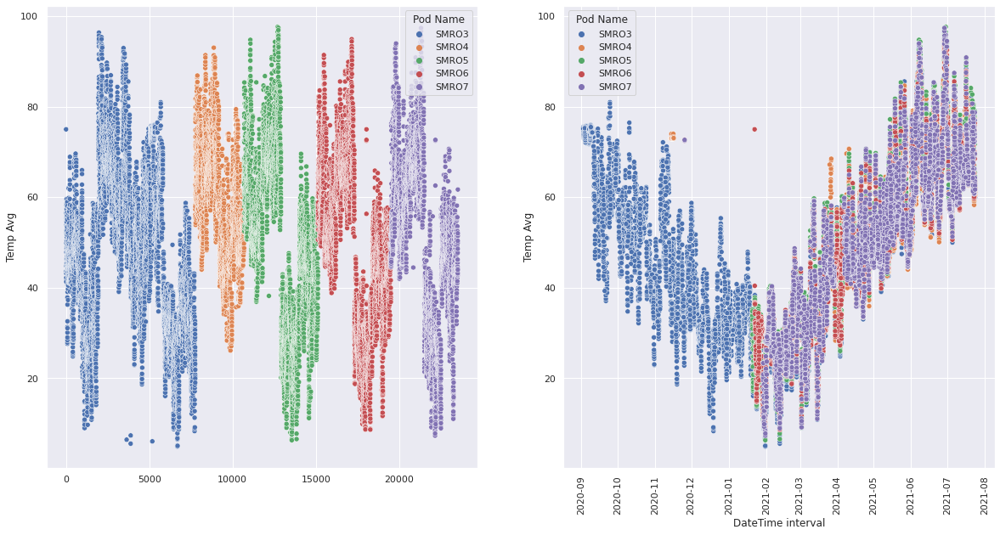

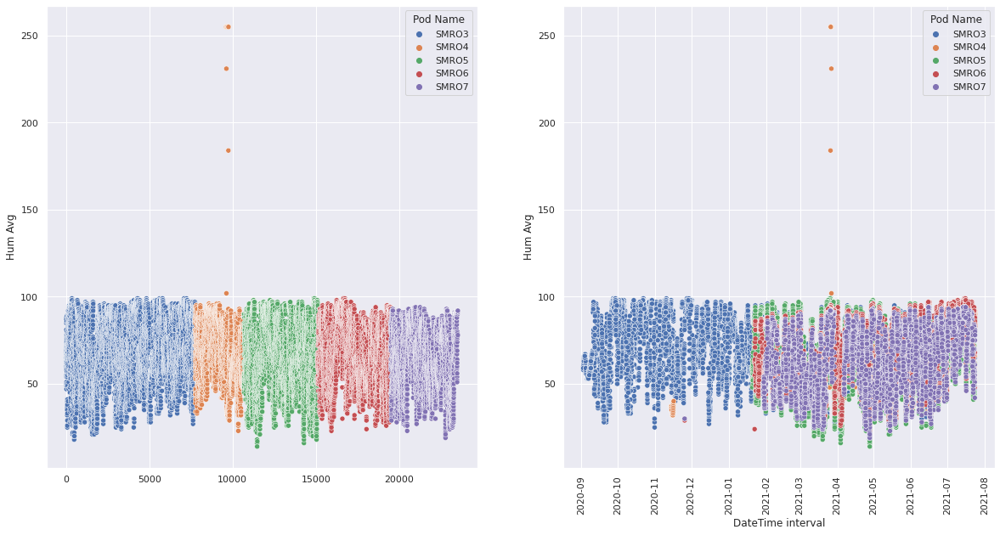

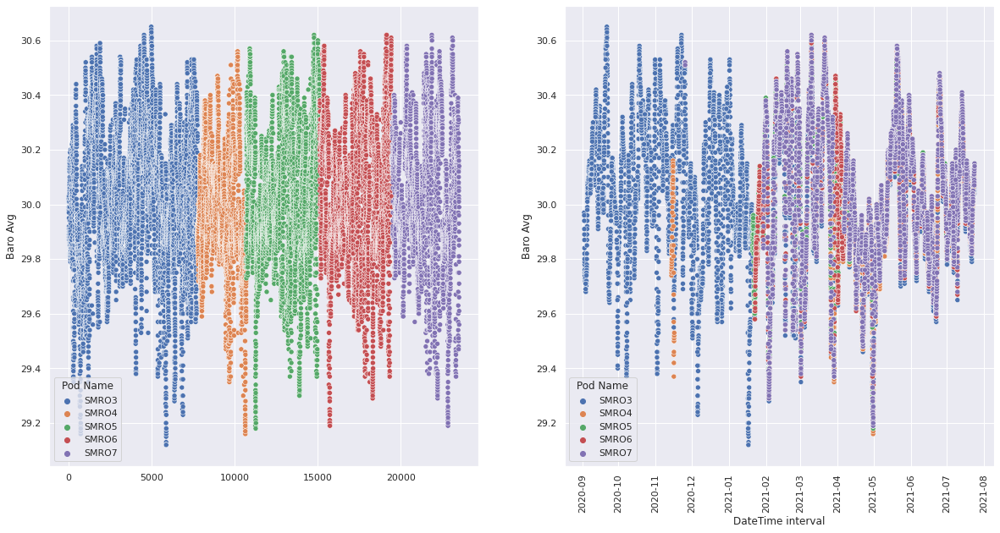

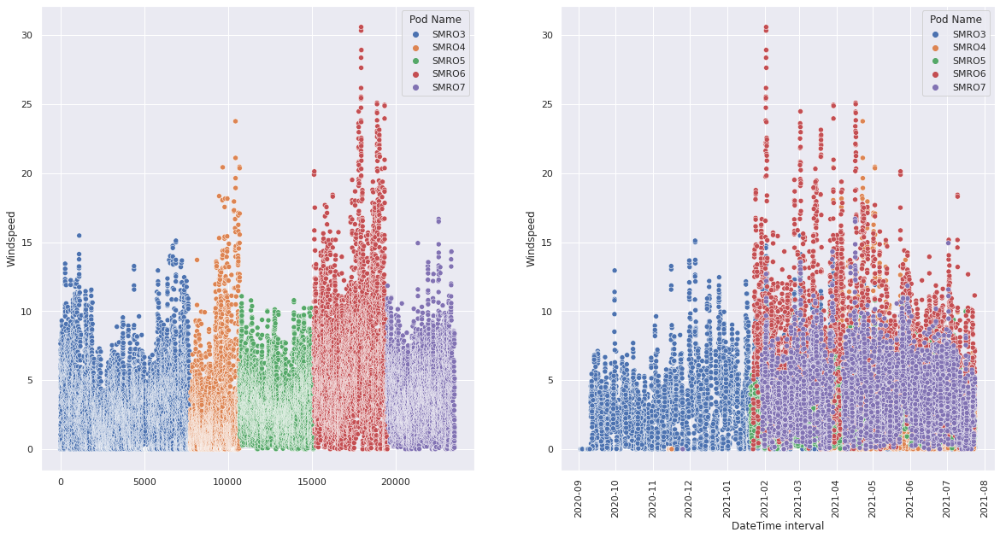

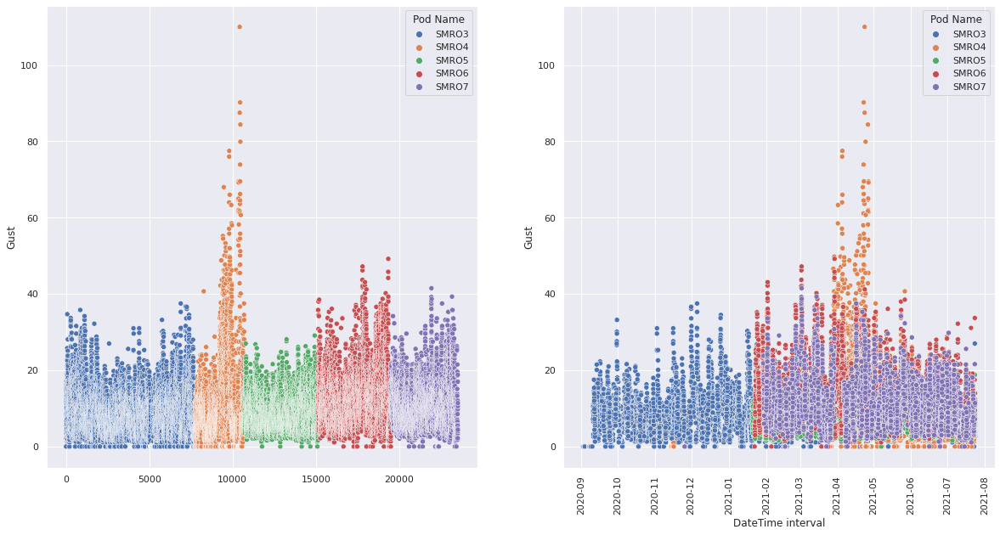

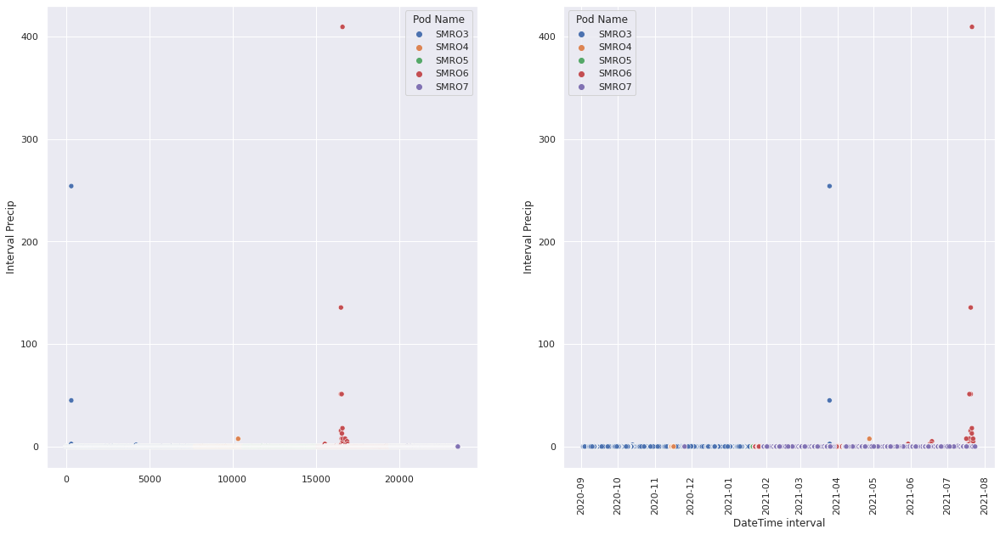

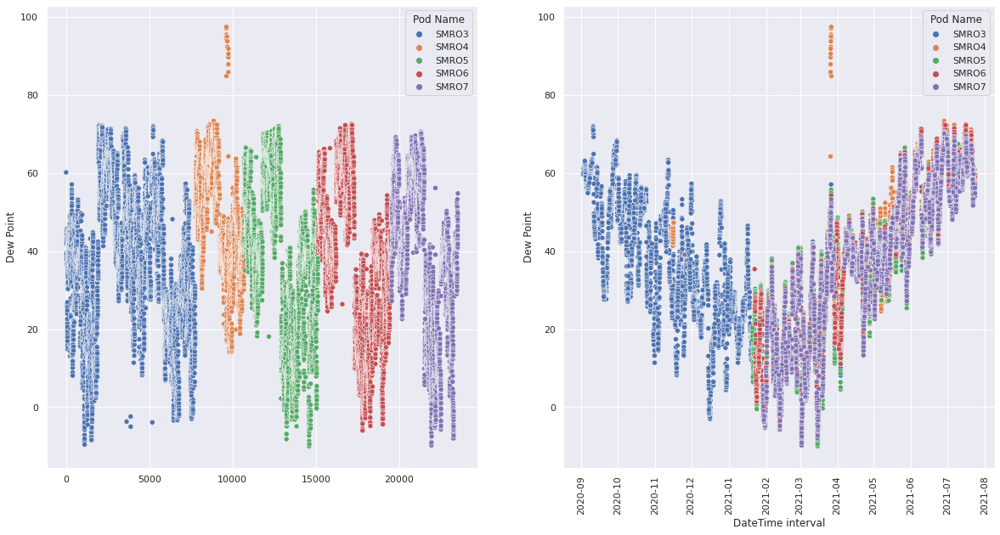

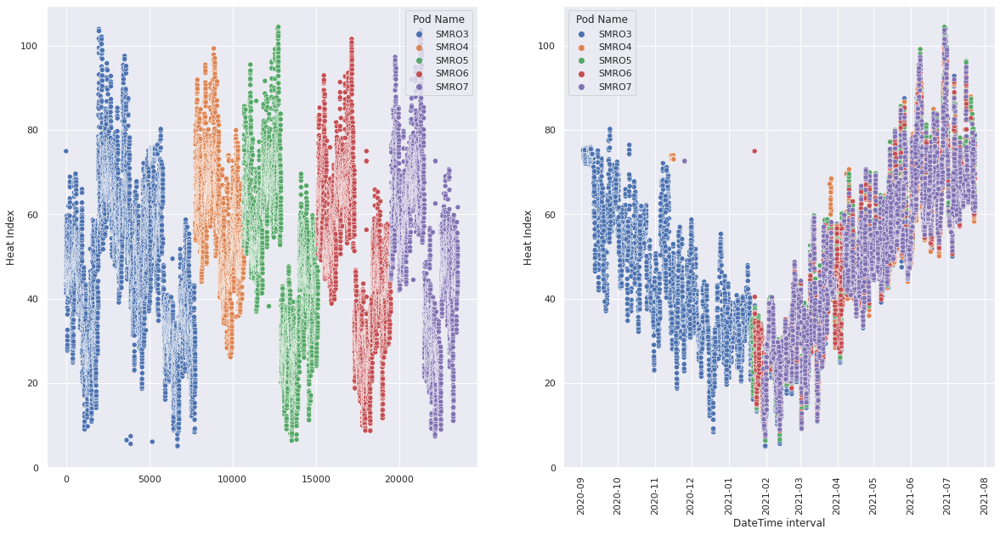

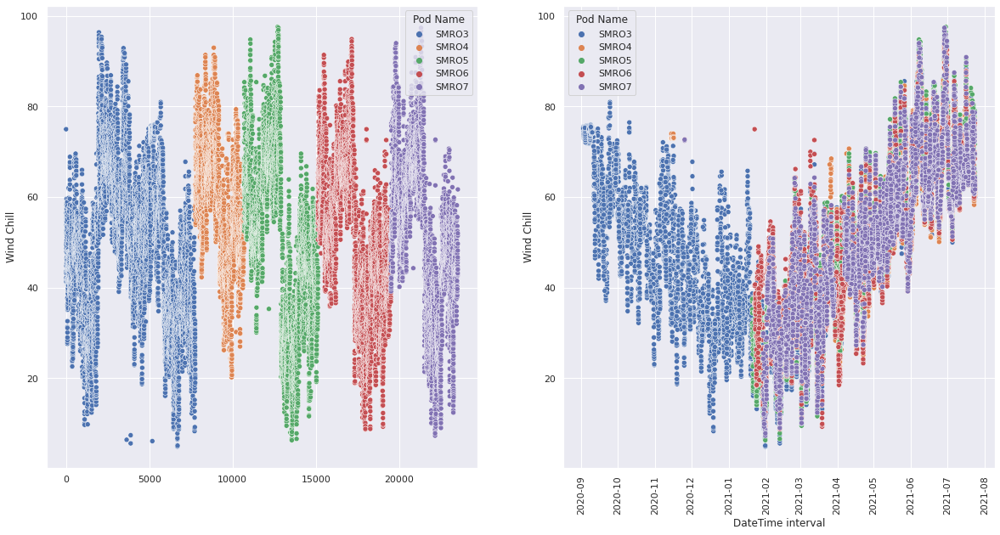

In [109]:
display_weather_EDA(df_weather_master,'scatter','hours')

#### REMOVING OUTLIERS IN WEATHER DATA
It is very clear in that the pod "SMRO4" produces some outliers, so we decided to remove it from the dataset. Since it has not been measuring the weather data for a long period of time and because the other pods cover the same time frame as "SMRO4" we decided to remove that data from our analyses.

In [110]:
#@title 

#This codeblock is written to remove the outliers like allof SMRO4

#remove SMRO4
df_weather_master = df_weather_master[df_weather_master['Pod Name'] != 'SMRO4']

# SMRO6 and SMRO7 also had 1 or 2 outliers that we remove here. 
# SMRO6 and SMRo7 had two clusters of data when plotte over time. The two clusters
# were separated by a gap in time and we will be removing the smaller of the two clusters
#which are composed of 2-3 measurements. These were likely measured for some preliminary testing 
# of the pod and this will only hinder our data as they look like outliers as weel. 
# Manually remove SMRO6 outliers
SMRO6_only = df_weather_master[df_weather_master['Pod Name'] == 'SMRO6']
df_weather_master = df_weather_master[df_weather_master['Pod Name'] != 'SMRO6']
SMRO6_outlier_date = convert_val_to_dt(22,1,2021,time=True, hour_int=10) 
SMRO6_removed_outlier = SMRO6_only[SMRO6_only['Date & time (hour rounded)'] > SMRO6_outlier_date ]
df_weather_master = df_weather_master.append(SMRO6_removed_outlier)

# remove SMRO7
SMRO7_only = df_weather_master[df_weather_master['Pod Name'] == 'SMRO7']
df_weather_master = df_weather_master[df_weather_master['Pod Name'] != 'SMRO7']
SMRO7_outlier_date = convert_val_to_dt(25,11,2020,time=True,hour_int=23) 
SMRO7_only = SMRO7_only[SMRO7_only['Date & time (hour rounded)'] > SMRO7_outlier_date]

df_weather_master = df_weather_master.append(SMRO7_only)

#### REMOVING OUTLIERS IN WEATHER DATA CONTINUED
As you can see in the visualization produced by the code block below, removal of the outliers has produced data that looks much more consistent.

Important note: The code block below may take a minute or so to run as there are a lot of data points to display. 

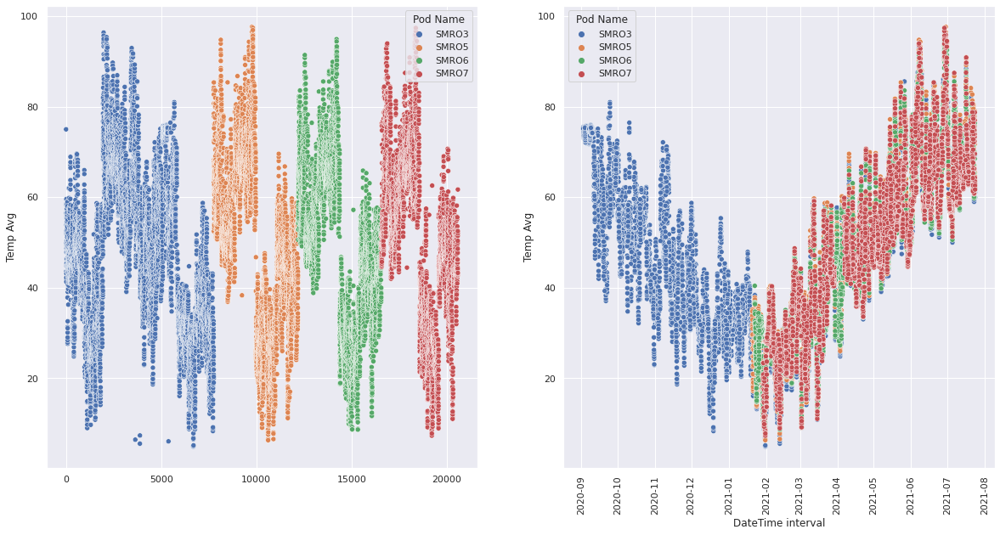

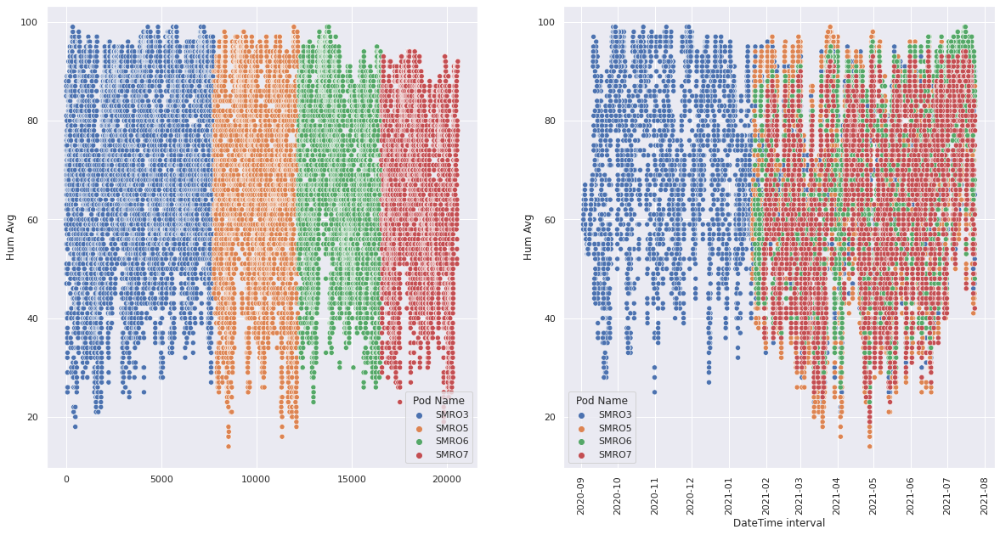

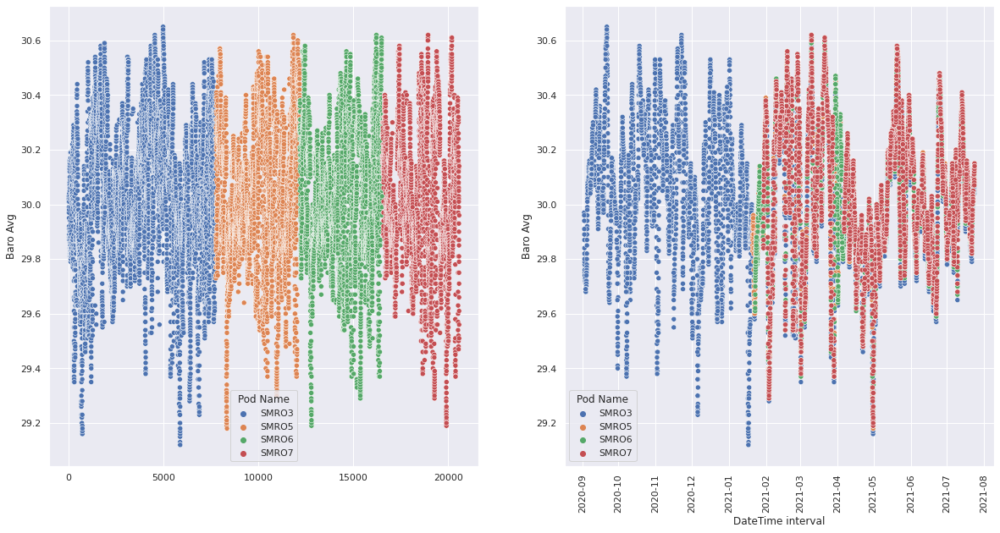

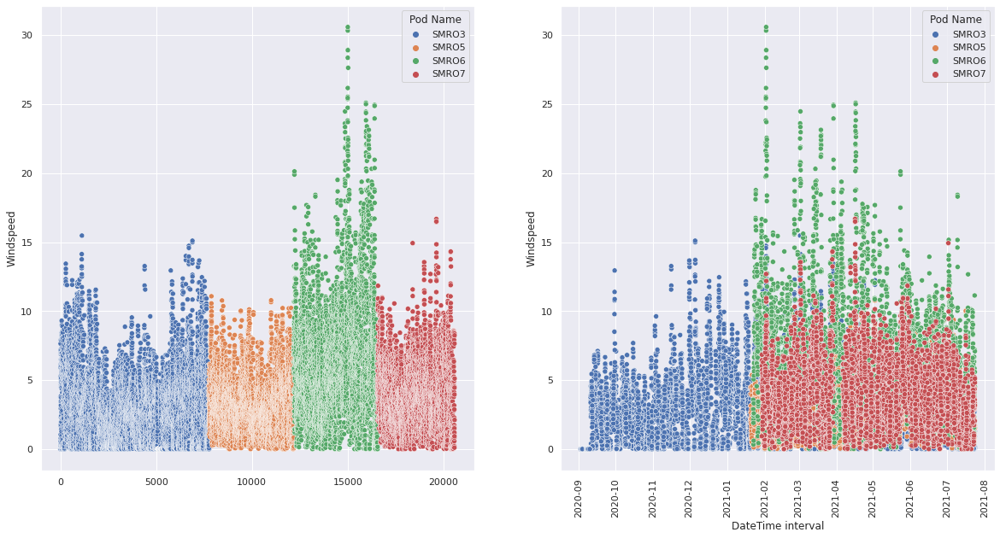

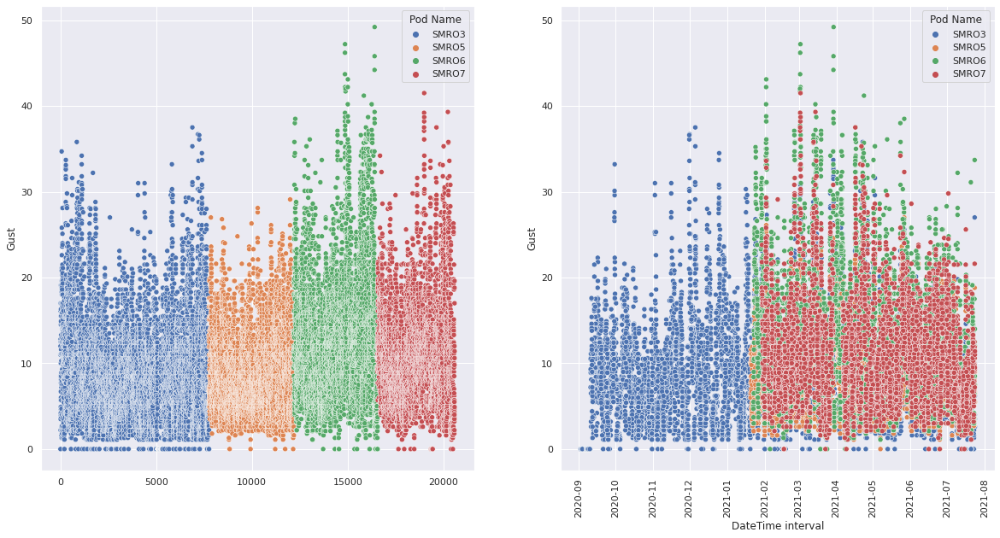

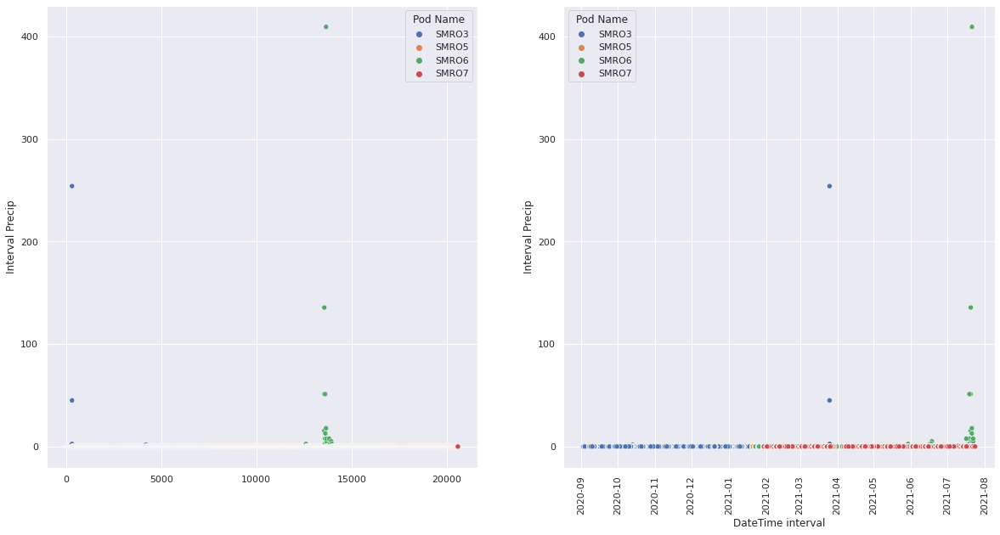

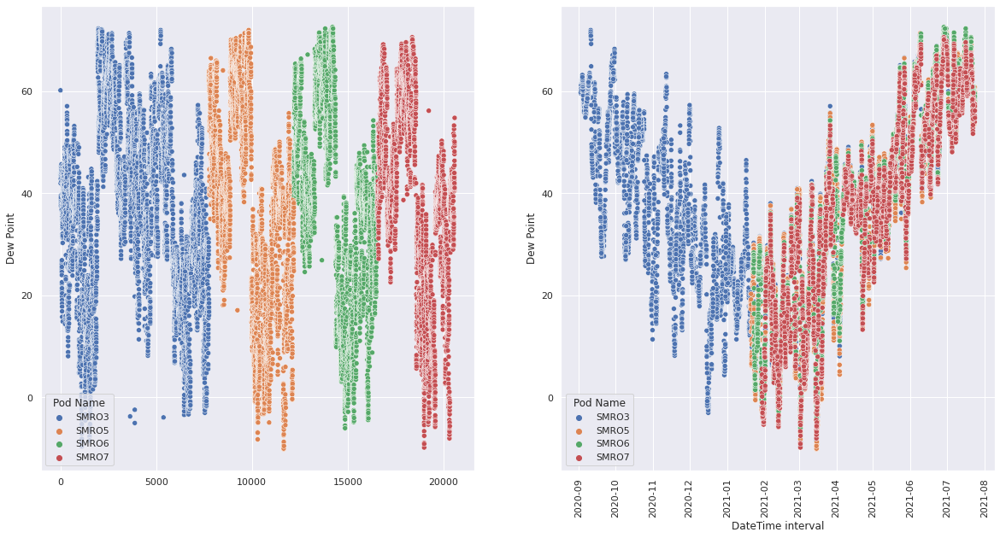

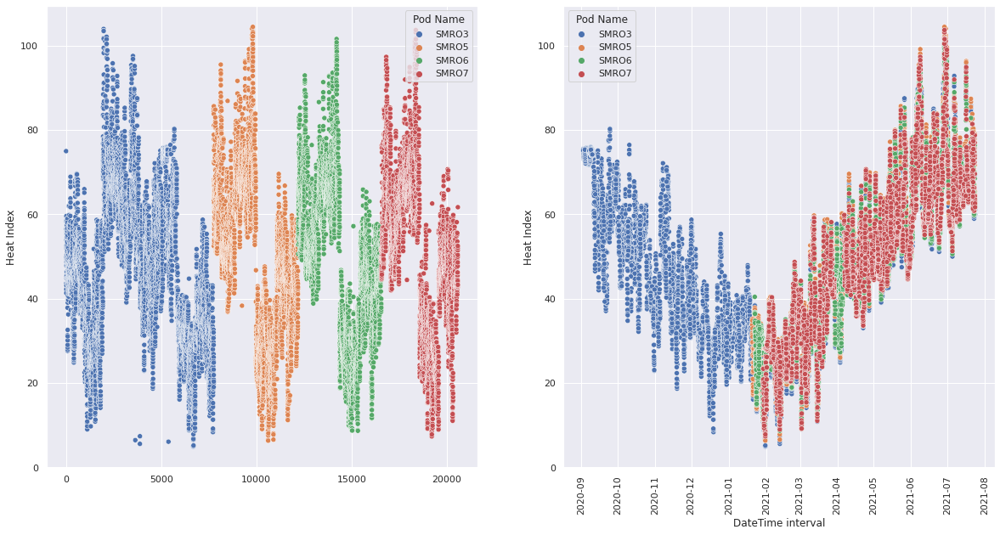

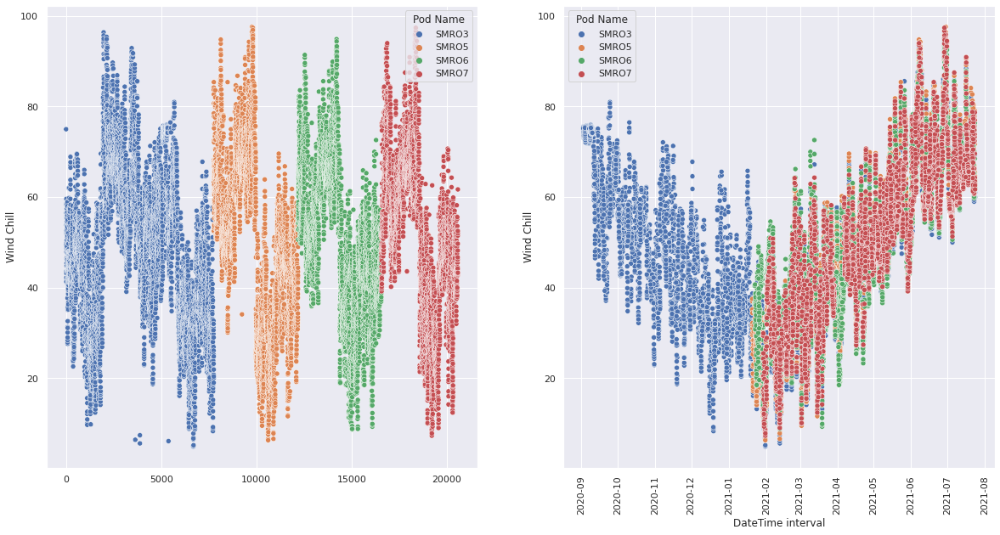

In [111]:

display_weather_EDA(df_weather_master,'scatter','hours')

### Merging Weather and Number of Complaints
The next step is to get the number of complaints made per hour and merge that data with our weather data. Since the weather data so far only cover's measurements for a year (2020-2021), and the complaint data set (df_stinky_master) covers data from 2019-2021, analyses of weather and complaints can only be done on matching date ranges. This means we had to trim the earlier complaint data that did not match the dates in the weather data. 

In [112]:
#@title 
merged_by_hours = get_merged_trimmed_df(df_weather_master, df_stinky_master,'hours')
merged_by_days = get_merged_trimmed_df(df_weather_master, df_stinky_master,'days')
merged_by_weeks = get_merged_trimmed_df(df_weather_master, df_stinky_master,'weeks')


###Merging Weather and Number of Complaints Continued
The figures below represent the data points of each weather variable plotted over time. The points in this particular figure represent data aggregation by days. The color of the dots indicates the number of complaints made those days.

We explored the data in different states of aggregation and we found that these plots show us something interesting in the data. These plots removed the data points were complaint totals = 0. From this data, it's clear to see that around the months 01/2021, 02/20201, and the start of 03/2021 that density of the data points decrease which indicates fewer complaints made.

We wanted to invesitgate this by looking at the total complaints made my month.  

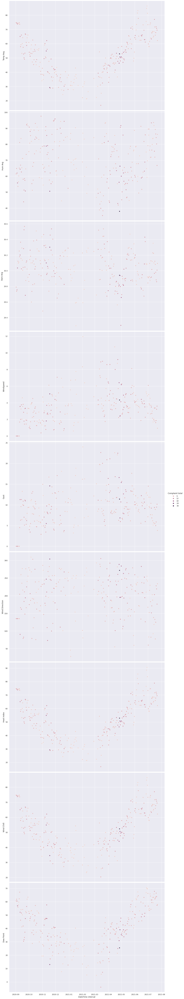

In [113]:
merged_by_days_no_zeroes = merged_by_days[merged_by_days['Complaint total'] != 0]
complaints_and_weather_fig = sns.pairplot(data=merged_by_days_no_zeroes, x_vars= ['DateTime interval'], y_vars=['Temp Avg',
       'Hum Avg','Baro Avg','Windspeed', 'Gust', 'Wind Direction',
       'Heat Index', 'Wind Chill', 'Dew Point'], hue='Complaint total', height=10, aspect=1.5)

In [114]:
#@title 
complaint_data_only = get_complaint_df(df_stinky_master)
complaint_data_month_sum = (complaint_data_only.groupby(['Month_of_year'])['Complaint total'].sum()).reset_index()
month_order = ['January', 'February', 'March', 'April', 'May', 
         'June', 'July', 'August', 'September', 'October',
          'November', 'December']
complaint_data_season_sum = (complaint_data_only.groupby(['Season'])['Complaint total'].sum()).reset_index()
season_order = ['Winter','Spring','Summer','Fall']

###Analyses of months
In the figures below, the plot on the left displays the average complaints per month. The plot on the right is the absolute amount of complaints per month. Since we are not analyzing weather data in these plots, we use the complete date
range provided by the smell dataframe (2019-2021). 

As you can see in the figures below the months of December, January, and February hve the lest complaints and the months of May, June, July, and August have the largest complaints. 

This seems to display that the complaints have some seasonal correlation.

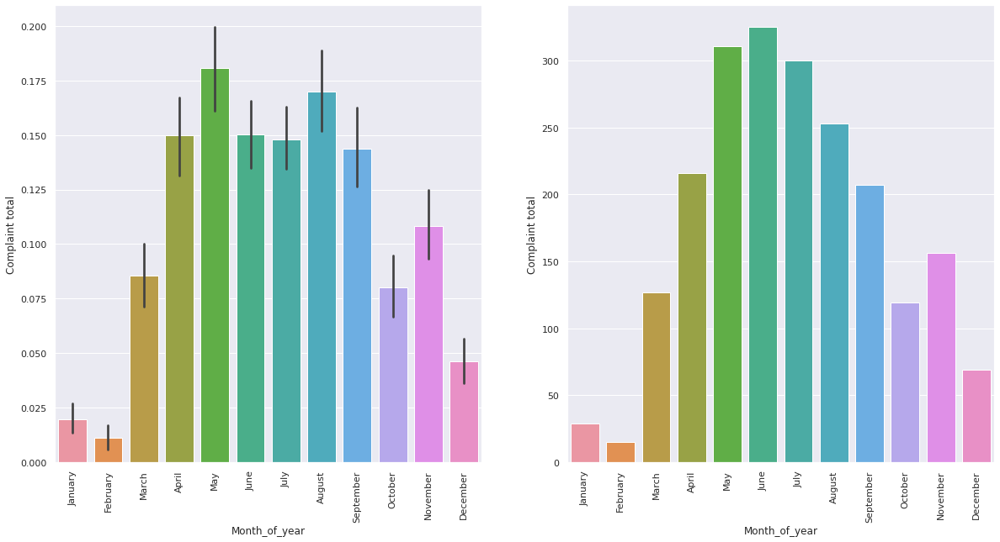

In [115]:
f, axes = plt.subplots(1, 2)
sns.barplot(data=complaint_data_only,x='Month_of_year',y='Complaint total',order=month_order, ax=axes[0])
sns.barplot(data=complaint_data_month_sum,x='Month_of_year',y='Complaint total',order=month_order, ax=axes[1])
axes[0].tick_params(axis='x', rotation=90)
axes[1].tick_params(axis='x', rotation=90)

###Seasonal Analyses
In the figures below, the plot on the left displays the average complaints per season. The plot on the right is the absolute amount of complaints per season. Since we are not analyzing weather data in these plots, we used the complete date range provided by the smell dataframe/df_stinky_master (2019-2021).

As you can see in the figures below summer and spting have the most complaints and winter has the fewest complaints,

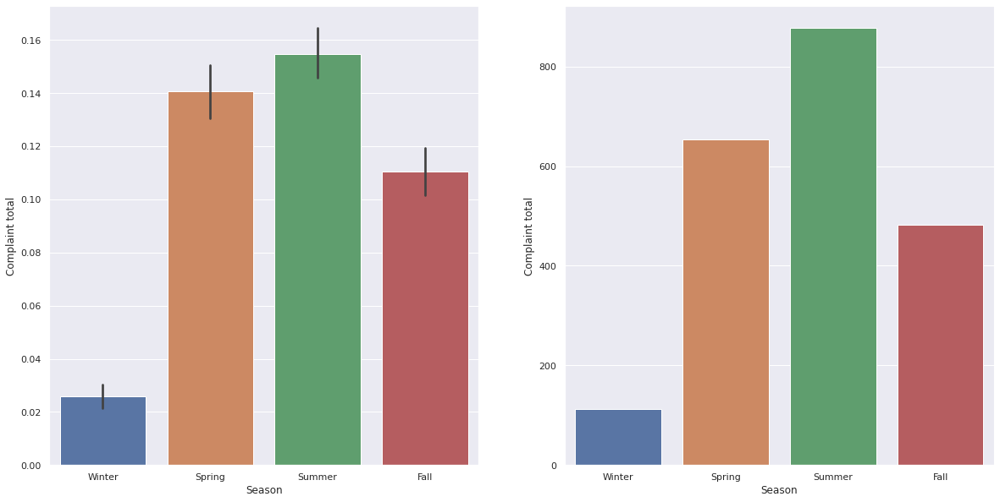

In [116]:
f, axes = plt.subplots(1, 2)
sns.barplot(data=complaint_data_only,x='Season',y='Complaint total',order=season_order, ax=axes[0])
sns.barplot(data=complaint_data_season_sum,x='Season',y='Complaint total',order=season_order, ax=axes[1])


### Map of complaint locations in the 2021 summer months and 2020-2021 winter months
There is a clear difference in the amount of complaints made in the summer and winter. You will need to zoom in to Portland to see the complaints.

In [117]:
#@title
winter_data=map_date("12-1-2020","02-28-2021")
summer_data=map_date("05-1-2020","07-31-2020")
make_map(summer_data)

In [118]:
#@title
make_map(winter_data)

### Weather Complaint Analyses
Aside from doing time interval analyses we also performed analyses of the weather variables and complaints. Preliminary analyses of the pairplots show that the complaints don't really cluster as their data distributions are prety much stacked on top of each other. We then decided to investigate if the presences of complaints cluster.

***Important: This code block will generate warnings, scroll down to see the plot when the code is finished running.

In [ ]:
custom_color = sns.color_palette("husl", 8)
sns.pairplot(data=merged_by_hours, x_vars=['Temp Avg','Hum Avg','Baro Avg', 'Windspeed','Gust', 'Heat Index', 'Wind Chill' ], 
y_vars=['Temp Avg','Hum Avg','Baro Avg','Windspeed','Gust', 'Heat Index', 'Wind Chill' ], hue='Complaint total')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.



In [ ]:
#@title 
def complaint_or_not(value : int):
  if value > 0:
    return 1
  else:
    return 0

merged_hours_yes_no = merged_by_hours.copy()
merged_hours_yes_no['Complaint total'] = merged_hours_yes_no['Complaint total'].apply(lambda x : complaint_or_not(x)) 

###Weather Complaint Analyses Continued
In the plot below, we were investigating to see if the data clustered on the basis of the existance of complaints (complaint total = 1) or the absence of complaints (complaint total = 0). The data doesn't really cluster. There seems to be a slight separation of the distribution of the for temp avg, heat index, and wind chill. This explain the spike of complaints in the hotter months/seasons.

In [ ]:
sns.pairplot(data=merged_hours_yes_no, x_vars=['Temp Avg','Hum Avg','Baro Avg', 'Windspeed','Gust', 'Heat Index', 'Wind Chill' ], 
y_vars=['Temp Avg','Hum Avg','Baro Avg','Windspeed','Gust', 'Heat Index', 'Wind Chill' ], hue='Complaint total')

In [ ]:
#@title 
data_model_analyses = merged_hours_yes_no[['Complaint total','Temp Avg', 'Hum Avg',  'Baro Avg', 'Windspeed', 'Gust', 'Wind Direction', 
 'Heat Index', 'Wind Chill', 'Dew Point']]
data_model_analyses = data_model_analyses.rename(columns={'Complaint total': 'target complaints'})
data_model_analyses = data_model_analyses.dropna()

### Correlation of Independent Variables Individually
The figure below is a correlation matrix of the variables that we hypothesize may influence the presence of a complaint (In this graph it is target complaints). As you can see, on an individual basis, there isn't really a correlation with target complaints.

In [ ]:
#@title
df3 = data_model_analyses
corrMatrix = df3.corr()
sns.heatmap(corrMatrix, annot=True, cmap= 'coolwarm')
plt.title("Correlation matrix of weather data")
plt.show()

#Testing different models 
###OLS model
In the figure below we made an ols model with the data and after performing backwards feature selection, this model identified that the key features that together strongly correlated with the presence of complaints were Temp Avg, Hum Avg, Heat Index, and Dew Point. 

In [ ]:
#@title
X = df3[['Temp Avg','Hum Avg', 'Heat Index','Dew Point']].copy()
X = sm.add_constant(X)
y = df3['target complaints']
# Fit regression model
results = sm.OLS(y, X).fit()
print(results.summary())

##Testing different models
###Logistic regression model
In the figure below logistic regression model with the data and after performing backwards feature selection, this model identified that the key features that together strongly correlated with the presence of complaints were Temp Avg, Hum Avg, Heat Index, and Dew Point - the same features identified in the ols model.

We decided to stick with the logistic regression model because it is a better model to use when the target can only be one of two values (1 = complaint(s) made, 0 = no complaints).


In [ ]:
#@title
#logistic
df3_copy = df3.copy() 
y=df3_copy[['target complaints']]
X = df3_copy[['Temp Avg', 'Hum Avg' ,'Heat Index','Dew Point']]
X = sm.add_constant(X)
logit_mod = sm.Logit(y,X)
logit_res = logit_mod.fit()
print(logit_res.summary())

In [ ]:
print(logit_res.summary())

###Optimizing logistic model
In order to optimize the logistic model, we have to find the best inverse of regulization. Below we find that the best value is 1.

In [ ]:
#@title
#model
lr = LogisticRegression(C=1e5, max_iter=1000) #c is regularization parameter
lr.fit(X, y.values.ravel())
y_pred = lr.predict(X) 


grid_values = {'penalty': ['l2'],'C':[1e-10,1e-09,1e-08,1e-07,1e-06,1e-05,0.0001,0.001,0.01,0.1,1,10,100,1000,10000]} #pre defined dictionary for logistic model
grid = GridSearchCV(lr, param_grid = grid_values,scoring = 'recall',cv=7) #lr=model object
grid.fit(X, y.values.ravel())
print('Best Inverse Regularization value = {}, penalty type = {}'.format(grid.best_params_['C'],
                                                                         grid.best_params_['penalty'])) 

###Logistic Model Validation
A confusion matrix was created to validate the model. The logistic model has an 87.5% accuracy. So now we are relatively confident that temperature, humidity, heat index, and dew point are very important features that effect the presence of complaints.

In [ ]:
#@title
mat = confusion_matrix(y, y_pred)
sns.heatmap(mat, square=True, annot=True, cbar=False)
plt.xlabel('predicted value')
plt.ylabel('true value')

In [ ]:
#@title
print('Logistic Model Accuracy: %.3f' % accuracy_score(y_true=y, y_pred=y_pred))
print('Logistic Model Precision: %.3f' % precision_score(y_true=y, y_pred=y_pred))
print('Logistic Model Recall: %.3f' % recall_score(y_true=y, y_pred=y_pred))
print('Logistic Model F1: %.3f' % f1_score(y_true=y, y_pred=y_pred))

###Boxplot analysis of features
The boxplots below show that median termperature average, median heat index, and median dew point for measurements when complaints were made. 

In [ ]:
#@title
def boxplot(y):
   plt.figure(figsize=(10, 10))
   sns.boxplot(data=df3, x= "target complaints", y=y)

boxplot("Temp Avg")
boxplot("Hum Avg")
boxplot("Heat Index")
boxplot("Dew Point")

###Violinplot analysis of features
The violin plots below show that a lot of complaints are made between temperature values of 40-60. This is also similar to heat index. The violin plot for dew point also shows that a lot of complaints occur when the dew point value is approcimately 40.

In [ ]:
#@title
def violinplot(y):
   plt.figure(figsize=(10, 10))
   sns.violinplot(data=df3_copy,x="target complaints", y=y, palette='Dark2')
   plt.xlabel("complaints (0-No, 1-Yes)")
violinplot("Temp Avg")
violinplot("Hum Avg")
violinplot("Heat Index")
violinplot("Dew Point")

#SUPPLEMENTARY FIGURES


Visualization of complaints by hour. The graph on the left represents the average complaints per hour. The graph on the right represents the absolute amount of complaints per hour from the complaint data set. 

In [ ]:
#@title
complaint_data_hour_sum = (complaint_data_only.groupby(['Hour Group'])['Complaint total'].sum()).reset_index()
hour_order_list = list(complaint_data_only['Hour Group'].unique())
hour_order_list.sort()
f, axes = plt.subplots(1, 2)
sns.barplot(data=complaint_data_only,x='Hour Group',y='Complaint total', order = hour_order_list, ax=axes[0])
sns.barplot(data=complaint_data_hour_sum,x='Hour Group',y='Complaint total', order = hour_order_list, ax=axes[1])
axes[0].tick_params(axis='x', rotation=90)
axes[1].tick_params(axis='x', rotation=90)

Visualization of complaints by weekday. The graph on the left represents the average complaints per weekday. The graph on the right represents the absolute amount of complaints per weekday from the complaint data set. 

In [ ]:
#@title
complaint_data_hour_weekday_sum = (complaint_data_only.groupby(['Day_of_week'])['Complaint total'].sum()).reset_index()
weekday_order = ['Monday','Tuesday', 'Wednesday','Thursday','Friday','Saturday','Sunday']
f, axes = plt.subplots(1, 2)
sns.barplot(data=complaint_data_only,x='Day_of_week',y='Complaint total', order = weekday_order, ax=axes[0])
sns.barplot(data=complaint_data_hour_weekday_sum,x='Day_of_week',y='Complaint total', order = weekday_order, ax=axes[1])
axes[0].tick_params(axis='x', rotation=90)
axes[1].tick_params(axis='x', rotation=90)

Visualization of complaints grouped by cardinal direction. The graph on the left represents the average complaints per cardinal direction. The graph on the right represents the absolute amount of complaints per cardinal direction from the merged data set.

In [ ]:
#@title
pd.options.mode.chained_assignment = None  # default='warn'
def remove_array(x):
  if type(x) != str:
    return 'None'
  else:
    return x

wind_dir_analysis = merged_hours_yes_no[['Complaint total', 'Cardinal Direction']]
wind_dir_analysis['Cardinal Direction'] = wind_dir_analysis['Cardinal Direction'].apply(lambda x : remove_array(x))

wind_sum = (wind_dir_analysis.groupby(['Cardinal Direction'])['Complaint total'].sum()).reset_index()
wind_order = ['None','North','North-East','East','South-East','South','South-West','West','North-West' ]
f, axes = plt.subplots(1, 2)
sns.barplot(data=wind_dir_analysis,x='Cardinal Direction',y='Complaint total', order = wind_order, ax=axes[0])
sns.barplot(data=wind_sum,x='Cardinal Direction',y='Complaint total', order = wind_order, ax=axes[1])
axes[0].tick_params(axis='x', rotation=90)
axes[1].tick_params(axis='x', rotation=90)